# Where the Water Flows -- Glacier de Bonne Pierre

In [4]:
using Pkg; Pkg.activate("/scratch-1/cogier/hydraulic_barriers/")
Pkg.resolve()
using Rasters
using Shapefile
using WhereTheWaterFlowsSubglacially, WhereTheWaterFlows
const WWFS = WhereTheWaterFlowsSubglacially
const WWF = WhereTheWaterFlows
using ArchGDAL
#using MAT
using Plots
using GlacioTools
include("/scratch-3/cogier/GlacioTools.jl/src/Rasters_helpers.jl")
#using GLMakie
#Pkg.status()
include("/scratch-3/cogier/WhereTheWaterFlowsSubglacially.jl/src/helpers.jl")
using CSV
using DataFrames



  Activating project at `/scratch-1/cogier/hydraulic_barriers`
  No Changes to `/scratch-1/cogier/hydraulic_barriers/Project.toml`
  No Changes to `/scratch-1/cogier/hydraulic_barriers/Manifest.toml`


LoadError: LoadError: UndefVarError: `Point2` not defined in `Main`
Suggestion: check for spelling errors or missing imports.
Hint: a global variable of this name may be made accessible by importing GeometryBasics in the current active module Main
in expression starting at /scratch-3/cogier/WhereTheWaterFlowsSubglacially.jl/src/helpers.jl:115

In [5]:
datadir_in = "/scratch-3/cogier/data/DEM_input"
datadir_out = "/scratch-3/cogier/data/DEM_output"


"/scratch-3/cogier/data/DEM_output"

### Import Ice thickness ###

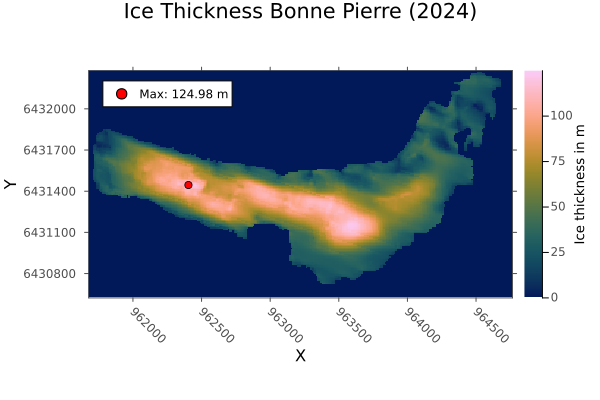

In [6]:
# Bonne Pierreice thickness 2024
ice_thickness_2024 = Raster(joinpath(datadir_in,"IceThickness.tif"));
ice_thickness_2024[ice_thickness_2024 .< 0] .= 0

# Find max value and its index
max_value = maximum(ice_thickness_2024)
max_index = argmax(ice_thickness_2024)  # Returns linear index
x,y = dims(ice_thickness_2024)
x_max, y_max = x[max_index[1]],y[max_index[2]]

Plots.heatmap(ice_thickness_2024,title="Ice Thickness Bonne Pierre (2024)",colorbar_title="Ice thickness in m") 
scatter!([x_max],[y_max], color=:red, markersize=4,label="Max: $(round(max_value, digits=2)) m")

### Import Bed ###

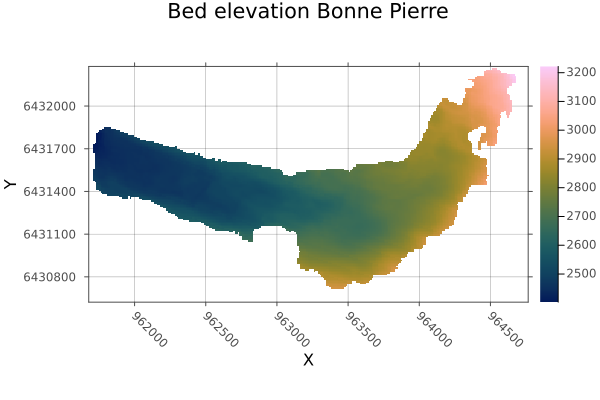

In [7]:
# Bonne Pierre bed
bed = Raster(joinpath(datadir_in, "Bedrock.tif"))
bed[bed .< 0] .= NaN # -9999 values
Plots.heatmap(bed,title="Bed elevation Bonne Pierre")
#Plots.contour!(mask, color=:black,levels=[0.5])  







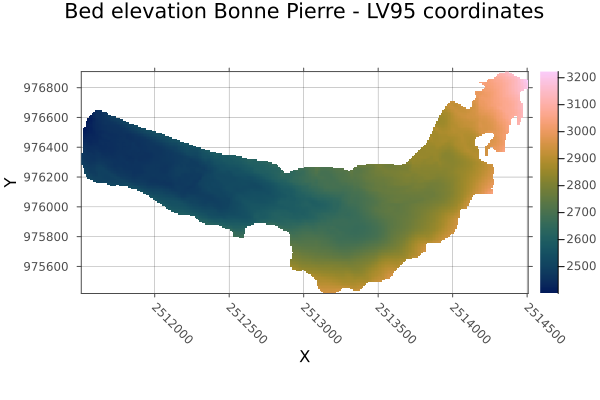

In [8]:
bed_swiss = Raster(joinpath(datadir_in, "grid_bedrock_10m.tif"))
crs(bed_swiss)
Plots.heatmap(bed_swiss,title="Bed elevation Bonne Pierre - LV95 coordinates")



### Import Surface (crop and resample bed) ###

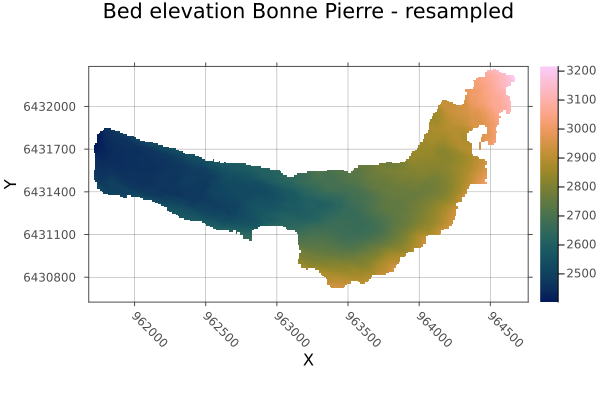

In [9]:
# surface_2021 
all_surface_2021 = Raster(joinpath(datadir_in,"Berarde_Res1.0_CompElevmean_merged.tif"));

#crop surface 2021
surface_2021_cr = crop(all_surface_2021; to=bed)
surface_2021_cr[surface_2021_cr .< 0] .= NaN

# resample bed and ice_thickness
bed_resamp = resample(bed; to=surface_2021_cr,method=:bilinear)  #the use of bilinear instead of nearest change quite a bit. bilinear smooth the transition, nearest does not
#note also that bilinear snooth the weird pattern in bed original (after transformation from LV95 to Lambert93)
mask = bed_resamp.> 0
#bed_resamp = resample(bed; to=surface_2021_cr, extent=extent(bed))
#bed_resamp[bed_resamp .< 0] .= NaN # -9999 values
ice_thickness_2024_resamp = resample(ice_thickness_2024; to=surface_2021_cr,method=:bilinear)

#Plot
Plots.heatmap(surface_2021_cr,title="surface elevation 2021 catchement Bonne Pierre")
contour!(mask, color=:black,levels=[0.5],title="surface elevation 2021 catchement Bonne Pierre")  
heatmap(bed_resamp,title="Bed elevation Bonne Pierre - resampled")



In [10]:
step(dims(surface_2021_cr)[1])


1.0

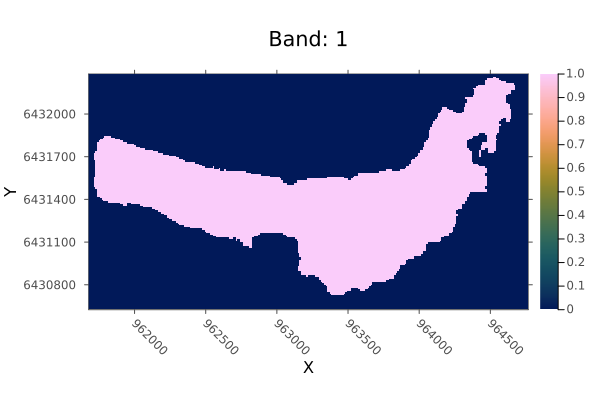

In [11]:
heatmap(mask)

In [12]:
dims(bed_resamp) == dims(surface_2021_cr)


true

### Calculate ice thickness 2021 ###

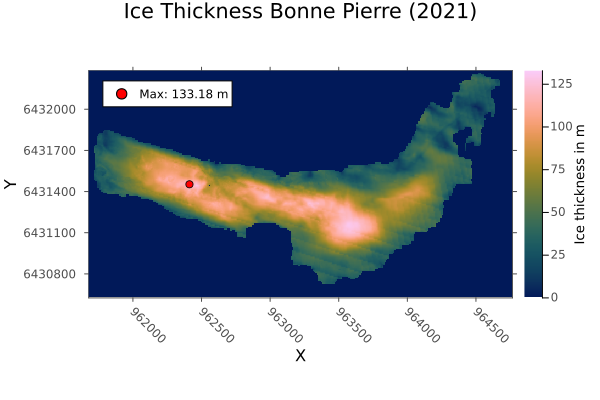

In [13]:
# Ice Thickness 2021

ice_thickness_2021 = surface_2021_cr .- bed_resamp
ice_thickness_2021[isnan.(ice_thickness_2021)] .= 0
ice_thickness_2021[ice_thickness_2021 .< 0] .= 0

# Find max value and its index
max_value = maximum(ice_thickness_2021)
max_index = argmax(ice_thickness_2021)  # Returns linear index
x,y = dims(ice_thickness_2021)
x_max, y_max = x[max_index[1]],y[max_index[2]]

Plots.heatmap(ice_thickness_2021,title="Ice Thickness Bonne Pierre (2021)",colorbar_title="Ice thickness in m") 
scatter!([x_max],[y_max], color=:red, markersize=4,label="Max: $(round(max_value, digits=2)) m")



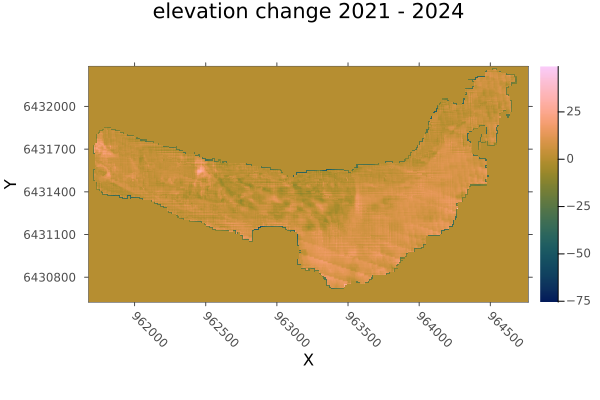

In [14]:
# diff 2024 - 2021
ice_thickness_2024 = resample(ice_thickness_2024; to=ice_thickness_2021)
ice_thickness_diff = ice_thickness_2021 .- ice_thickness_2024

heatmap(ice_thickness_diff,title="elevation change 2021 - 2024")

In [15]:
# Glacier free landscape
#ice_free_surface_2021 = mosaic(first,bed_resamp,surface_2021_cr;missingval)
#Plots.heatmap(ice_free_surface_2021,title="Ice free surface elevation 2021 catchement Bonne Pierre")
#contour!(mask, color=:black,levels=[0.5],title="Ice free surface elevation 2021 catchement Bonne Pierre")  


In [16]:
dims(surface_2021_cr) == dims(ice_thickness_2021)

true

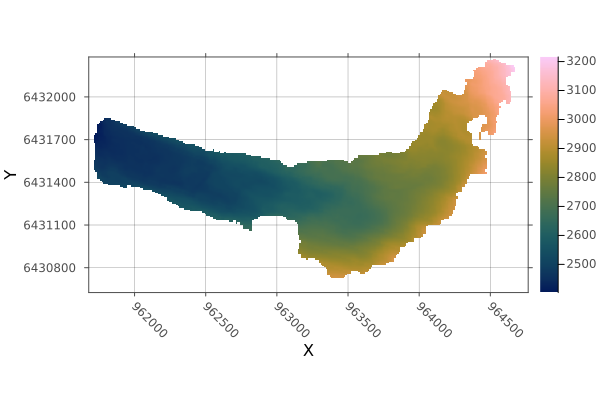

In [17]:
# Use mosaic to replace valid values of `bed` into `surface_2021_cr`
combined = mosaic(first, bed_resamp, surface_2021_cr)
heatmap(combined)

In [18]:
dims(surface_2021_cr)

X Projected{Float64} LinRange{Float64}(961678.0, 964764.0, 3087) ForwardOrdered Regular Intervals{Start} crs: WellKnownText,
Y Projected{Float64} LinRange{Float64}(6.43228e6, 6.43062e6, 1655) ReverseOrdered Regular Intervals{Start} crs: WellKnownText

### Smooth surface ###

In [19]:
###

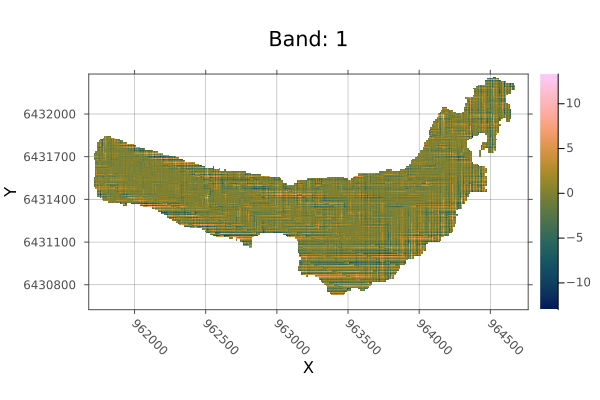

In [20]:
bed_resamp_bilinear = resample(bed; to=surface_2021_cr,method=:bilinear)  
bed_resamp_near = resample(bed; to=surface_2021_cr,method=:nearest)  
heatmap(bed_resamp_bilinear .- bed_resamp_near)

### Sensitivity test of smooth surface in subglacial lake volume ###

In [26]:

# Define parameters
x, y = dims(surface_2021_cr)
y = x  # Trick to satisfy WWFS.smooth_surface dx=dy requirements (because dy = -1, and dx = 1)
dx = step(dims(surface_2021_cr)[1])
ice_fractions = 0:0.05:0.5  # Ice fraction from 0 to 0.5 in increments of 0.05 : spatially adaptive smoothing length
minwindow = 0  # Minimal smoothing window
results = DataFrame(ice_fraction=Float64[], max_ice_thickness=Float64[], sum_lake=Float64[])
mask = bed_resamp.> 0
lakes_free_surf = 0 # initiation

# Iterate over ice fractions
for ice_fraction in ice_fractions
    # Smooth the surface
    surface_2021_smooth = WWFS.smooth_surface(x, y, surface_2021_cr, bed_resamp, ice_fraction, mask)

    #The smoothing window is defined as twice the product of the ice_fraction and the local ice thickness, with a minimal window size (minwindow) added.

    # Compute ice thickness
    ice_thickness_2021_smooth = surface_2021_smooth .- bed_resamp

    # Find max ice thickness and location
    max_value = maximum(ice_thickness_2021_smooth[.!isnan.(lakes_free_surf) .&& mask])


    # Compute WWFS and extract lake surface
    (_, _, _, _, _, _, _, _), (_, _, _, _), (_, lakes_free_surf), _ = 
        WWFS.waterflows_subglacial(surface_2021_smooth, surface_2021_cr .- ice_thickness_2021, 
                                   dx, gamma=[0, WWFS.GAMMA][1], bnd_as_sink=true, drain_pits=true)

    # Compute sum of lake surface within mask
    sum_lake = sum(lakes_free_surf[.!isnan.(lakes_free_surf) .&& mask])

    # Store results
    push!(results, (ice_fraction*2, max_value, sum_lake))
end

# Save results to CSV
CSV.write(joinpath(datadir_out, "smooth_values.csv"), results)


LoadError: UndefVarError: `CSV` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [92]:
results

Row,ice_fraction,max_ice_thickness,sum_lake
,Float64,Float64,Float64


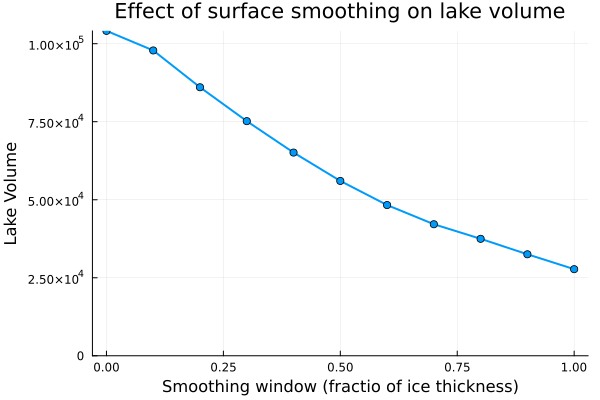

In [ ]:
# Extract columns from DataFrame
ice_fractions = results.ice_fraction
lake_volumes = results.sum_lake

# Create the plot
plot(ice_fractions, lake_volumes, marker=:circle, xlabel="Smoothing window (fractio of ice thickness)", ylabel="Lake Volume",
     title="Effect of surface smoothing on lake volume", linewidth=2, legend=false,ylim=(0, maximum(lake_volumes)))

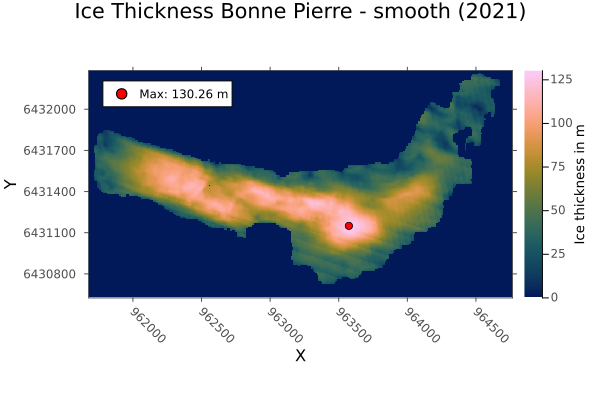

In [33]:
# smooth surface
x,y = dims(surface_2021_cr)
y = x #a trick as WWFS.smooth_surface test: @assert dy==dx and here dy = -1 (dx=1)
ice_fractio = 0.5 # %  is the fraction of ice thickness over which to average (in the +/- sense).  So goes from 0 to infinity. Probably 0.5 is good
minwindow = 0 #m, minimal window
surface_2021_smooth = WWFS.smooth_surface(x,y,surface_2021_cr, bed_resamp, ice_fractio, mask);

#smooth ice thickness too
ice_thickness_2021_smooth = surface_2021_smooth .- bed_resamp
ice_thickness_2021_smooth[isnan.(ice_thickness_2021_smooth)] .= 0
ice_thickness_2021_smooth[ice_thickness_2021_smooth .< 0] .= 0

# Find max value and its index
max_value = maximum(ice_thickness_2021_smooth)
max_index = argmax(ice_thickness_2021_smooth)  # Returns linear index
x,y = dims(ice_thickness_2021_smooth)
x_max, y_max = x[max_index[1]],y[max_index[2]]

Plots.heatmap(ice_thickness_2021_smooth,title="Ice Thickness Bonne Pierre - smooth (2021)",colorbar_title="Ice thickness in m") 
scatter!([x_max],[y_max], color=:red, markersize=4,label="Max: $(round(max_value, digits=2)) m")


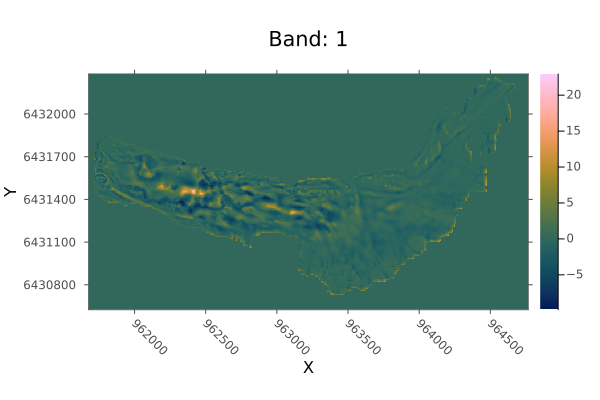

In [39]:
heatmap(surface_2021_cr .- surface_2021_smooth)
#heatmap(ice_thickness_2021_smooth .- ice_thickness_2021)


In [40]:
maximum(ice_thickness_2024)

124.980835f0

### Fill lakes at glacier surface 

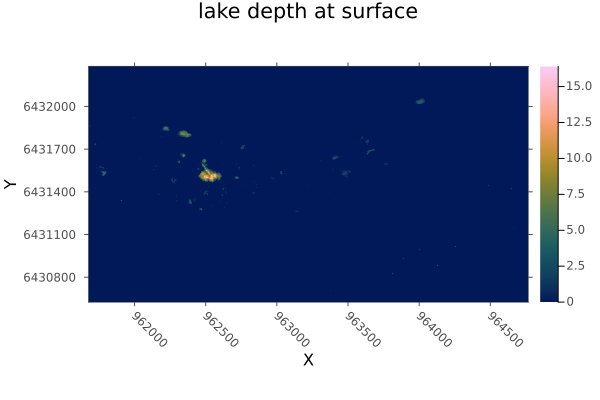

In [52]:
area, slen, dir, nout, nin, sinks, pits, c, bnds = WWF.waterflows(surface_2021_cr);
#plt_area(area, pits)
demf = fill_dem(surface_2021_cr, sinks, dir)
# "lake-depth"
lake_surface = demf.-surface_2021_cr
heatmap(lake_surface,title="lake depth at surface")
#sum(lake_surface[.!isnan.(lake_surface) .&& mask])

In [56]:
surface_2021_filled = surface_2021_cr .+ lake_surface;

#surface 2021 with surface lakes filled
(_, _, _, _, _, _, _, _),
         (_, _, _, _),
         (_, lakes_free_surf_2021_filled),
         _ = WWFS.waterflows_subglacial(surface_2021_filled, surface_2021_cr .- ice_thickness_2021, dx, gamma=[0,WWFS.GAMMA][1], bnd_as_sink=true, drain_pits=true);

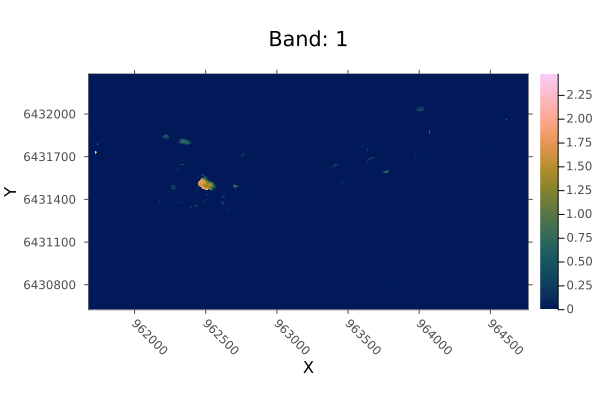

In [58]:
sum(lakes_free_surf_2021_filled[.!isnan.(lakes_free_surf_2021_filled) .&& mask])
heatmap(lakes_free_surf_2021_filled)

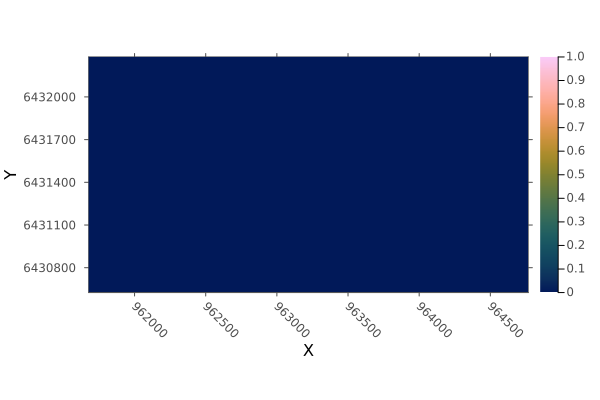

In [ ]:
# A single catchment of some point.  Choose one with large catchment:
i, j = max_index[1],max_index[2]
cc = catchment(dir, CartesianIndex(i,j))
heatmap(cc)
#scatter!(x[i], y[j], markersize=50)

In [77]:
replace_missing(bed, NaN)
missingval(bed_resamp)

-9999.0f0

In [78]:
maximum(ice_thickness_2021[mask])

133.17554f0

In [ ]:
mosaic(first,surface_2021_cr; to=bed_resamp)

## Water routing for 2021/2024 ice surface ##

In [ ]:

# 2021

## get cell size for WWFS
x,y = dims(surface_2021_cr)
dx = step(dims(surface_2021_cr)[1])

# Gamma is the Rothlisberger constant. [1] is without gamma, [2] is gamma=WWFS.GAMMA = -0.31 (Rothlisberger constant = stream deflection)

#surface 2021
(area_2021, slen_2021, dir, nout, nin, pits, c, bnds),
         (sc_locs, kappas, diro, phi_2021),
         (lakes, lakes_free_surf_2021),
         sinkout = WWFS.waterflows_subglacial(surface_2021_cr, surface_2021_cr .- ice_thickness_2021, dx, gamma=[0,WWFS.GAMMA][1], bnd_as_sink=true, drain_pits=true);


#surface smooth 2021
(area_2021_smooth, slen_2021_smooth, dir, nout, nin, pits, c, bnds),
         (sc_locs, kappas, diro, phi_2021_smooth),
         (lakes, lakes_free_surf_2021_smooth),
         sinkout = WWFS.waterflows_subglacial(surface_2021_smooth, surface_2021_cr .- ice_thickness_2021, dx, gamma=[0,WWFS.GAMMA][1], bnd_as_sink=true, drain_pits=true);







         

In [65]:
length(pits)

9554

In [47]:
# 2024


#surface 2024
(area_2024, slen_2024, dir, nout, nin, pits, c, bnds),
(sc_locs, kappas, diro, phi_2024),
(lakes, lakes_free_surf_2024),
sinkout = WWFS.waterflows_subglacial(surface_2021_cr .- ice_thickness_diff, surface_2021_cr .- ice_thickness_2021, dx, gamma=[0,WWFS.GAMMA][1], bnd_as_sink=true, drain_pits=true);

#area -- upslope area, tuple containing: total flux (m3/s), extra flux (m3/s), dissipation-melt-rate (m/s), pressure-melt-rate (m/s)

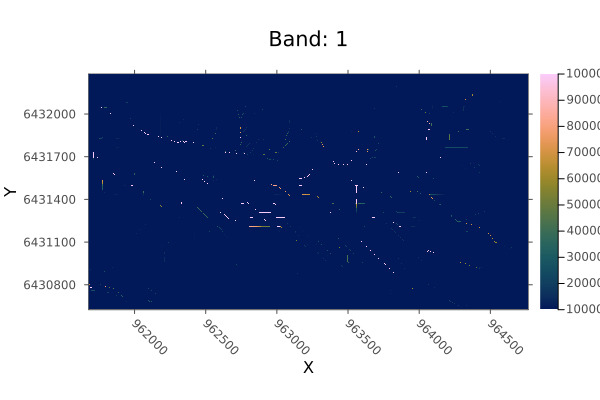

In [ ]:
heatmap(area_2024[1],clims=(1e4,1e5))





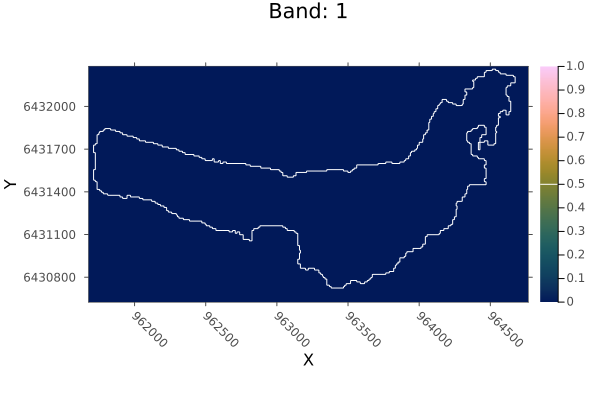

In [66]:
Plots.heatmap(lakes_free_surf_2021,title="lakes free surface 2021")
Plots.contour!(mask, color=:white,levels=[0.5]) 


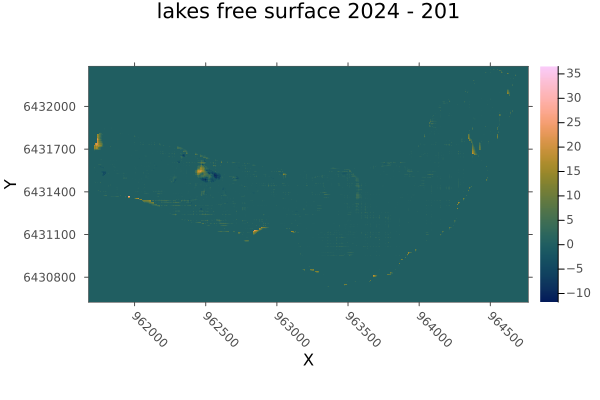

In [49]:
Plots.heatmap(lakes_free_surf_2024-lakes_free_surf_2021,title="lakes free surface 2024 - 201")

In [52]:
sum(filter(!isnan, lakes_free_surf_2021_smooth)) * dx * dx

60915.83184519796

In [54]:
sum(filter(!isnan, lakes_free_surf_2021)) * dx * dx

135516.1778301197

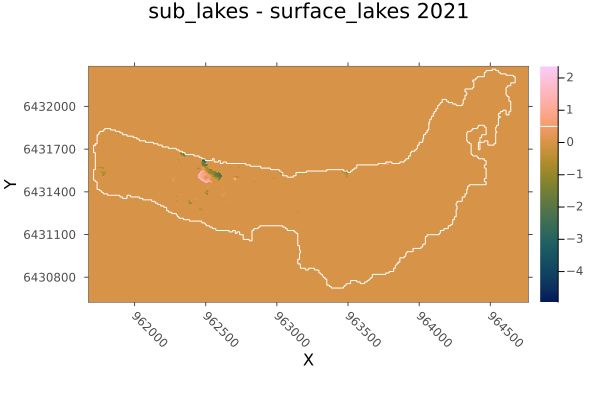

In [55]:
Plots.heatmap(lakes_free_surf_2021 - lake_surface)
contour!(mask, color=:white,levels=[0.5],
title="sub_lakes - surface_lakes 2021")  

In [57]:
# volume for all hydraulic barrier
vol_cum_lakes_2021_smooth = sum(filter(!isnan, lakes_free_surf_2021_smooth[mask])) * dx * dx
vol_cum_lakes_2021 = sum(filter(!isnan, lakes_free_surf_2021[mask])) * dx * dx
vol_cum_lakes_2024 = sum(filter(!isnan, lakes_free_surf_2024[mask])) * dx * dx
vol_cum_lakes_2021


102105.47861073697

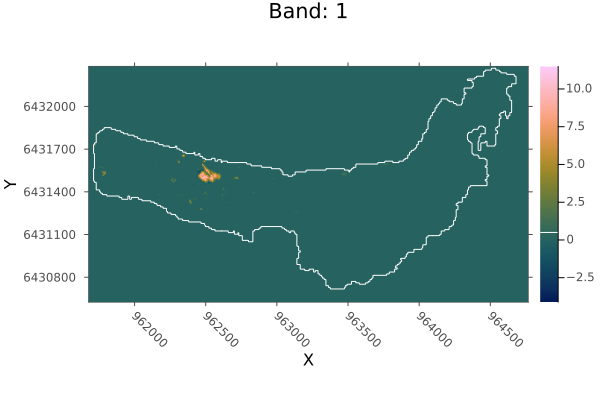

In [ ]:
Plots.heatmap(lakes_free_surf_2021 .- lakes_free_surf_2021_smooth)
contour!(mask, color=:white,levels=[0.5])

## Write outputs .TIF ##

In [75]:
write(joinpath(datadir_out,"Bedrock_resampled_1m.tif"),bed_resamp,force=true);

In [ ]:
#WRITE
write(joinpath(datadir_out,"lakes_free_surf_2021_BP.tif"),lakes_free_surf_2021,force=true);
write(joinpath(datadir_out,"lakes_free_surf_2021_BP_smooth.tif"),lakes_free_surf_2021_smooth,force=true);
write(joinpath(datadir_out,"phi_2021_BP.tif"),phi_2021,force=true);
write(joinpath(datadir_out,"lakes_free_surf_2024_BP.tif"),lakes_free_surf_2024,force=true);
write(joinpath(datadir_out,"phi_2024_BP.tif"),phi_2024,force=true);
write(joinpath(datadir_out,"area_2024_BP.tif"),area_2024[1],force=true);  
write(joinpath(datadir_out,"area_2021_BP.tif"),area_2021[1],force=true);
write(joinpath(datadir_out,"area_2021_BP_smooth.tif"),area_2021_smooth[1],force=true);




In [ ]:

mask_BP = Raster(mask, (x,y))
write(joinpath(datadir_out,"mask_BP.tif"), mask_BP,force=true);

┌ Warning: `missing` cant be written with gdal, missinval for `Bool` of `false` used instead
└ @ Rasters /home/cogier/.julia/packages/Rasters/nC6xb/src/utils.jl:29


MethodError: MethodError: Cannot `convert` an object of type Type{Bool} to an object of type ArchGDAL.GDALDataType
The function `convert` exists, but no method is defined for this combination of argument types.

Closest candidates are:
  convert(::Type{ArchGDAL.GDALDataType}, !Matched::Type{UInt32})
   @ ArchGDAL ~/.julia/packages/ArchGDAL/ujstt/src/utils.jl:142
  convert(::Type{ArchGDAL.GDALDataType}, !Matched::Type{UInt16})
   @ ArchGDAL ~/.julia/packages/ArchGDAL/ujstt/src/utils.jl:142
  convert(::Type{ArchGDAL.GDALDataType}, !Matched::Type{Int32})
   @ ArchGDAL ~/.julia/packages/ArchGDAL/ujstt/src/utils.jl:142
  ...


In [ ]:
x

X Projected{Float64} ForwardOrdered Regular DimensionalData.Dimensions.LookupArrays.Intervals{DimensionalData.Dimensions.LookupArrays.Start} crs: WellKnownText
wrapping: 3087-element LinRange{Float64, Int64}:
 961678.0, 961679.0, 961680.0, 961681.0, …, 964762.0, 964763.0, 964764.0

# Stochastic distribution #

In [ ]:
### Stochastic


surfdem = surface_2021_cr
beddem = surface_2021_cr .- ice_thickness_2021
x,y = dims(surface_2021_cr)
mask_stoch = surfdem .> 0

cov_fn = [WWFS.GRF.gaussian_kernel, WWFS.GRF.exponential_kernel][1]
surfdem_uc = Uncertainty(absuc=0, reluc=0.005, correlation_length=200, covariance_fn=cov_fn)
beddem_uc = Uncertainty(absuc=0, reluc=0.05, correlation_length=200, covariance_fn=cov_fn)
floatfrac = 0.97 * ones(size(surfdem));
floatfrac_uc = Uncertainty(absuc=0, reluc=0.1, correlation_length=200, covariance_fn=cov_fn) #WWFS.GRF.gaussian_kernel)
waterinput = ones(size(surfdem));
waterinput_uc = Uncertainty()

ctch_sinks = [CartesianIndices((1:10, 1:length(y)))[:], CartesianIndices((1:10, 1:length(y)÷2))[:]]


model, get_sample, aggregate = WWFS.make_fns(step(x),
                                             surfdem, surfdem_uc,
                                             beddem, beddem_uc,
                                             floatfrac, floatfrac_uc,
                                             waterinput, waterinput_uc,
                                             ctch_sinks,
                                             mask_stoch)  
input, output = model(get_sample()...);
aggr = map_mc(model, get_sample, aggregate, 20)
#WWF.plt.plotarea(x, y, aggr.areas, pits)

Progress: 100%|█████████████████████████████████████████| Time: 0:01:44


(areas = Float32[1.0 1.8001182 … 2.6500533 1.0; 1.0 1.7501532 … 2.300069 1.0; … ; 1.0 1.000068 … 1.5500331 1.6500664; 1.0 1.0 … 1.8000202 1.1000011], areas_extra = Float32[0.0 0.0023664595 … 0.0010657907 0.0; 0.0 0.0030619605 … 0.0013847076 0.0; … ; 0.0 0.0013622083 … 0.00066036236 0.0013250901; 0.0 0.0 … 0.00040437552 2.2657709f-5], melt_freeze = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0009867646 … 0.0007252881 0.0; … ; 0.0 0.0013622083 … 0.0003719966 0.0; 0.0 0.0 … 0.0 0.0], lakes_depth = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], lakes_mask = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], lakes_depth_fs = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], lakes_mask_fs = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], sc_locs = Float32[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], kappas = F

In [ ]:
typeof(aggr)
fieldnames(typeof(aggr))

(:areas, :areas_extra, :melt_freeze, :lakes_depth, :lakes_mask, :lakes_depth_fs, :lakes_mask_fs, :sc_locs, :kappas, :catchments, :catchment_fluxes, :n_samples)

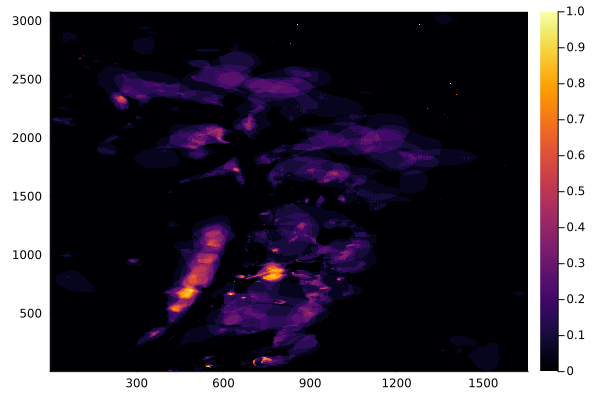

In [ ]:
heatmap(aggr.lakes_mask)

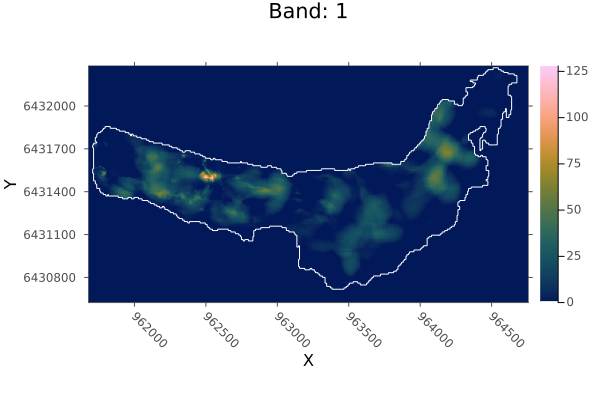

In [ ]:
aggr_lakes = Raster(aggr.lakes_depth, (x,y))
heatmap(aggr_lakes)
Plots.contour!(mask, color=:white,levels=[0.5]) 


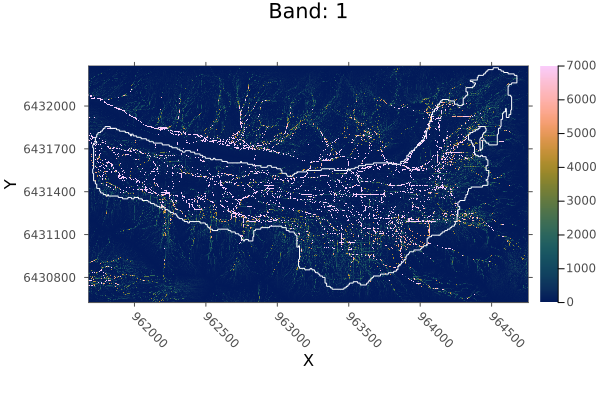

In [ ]:

aggr_area = Raster(aggr.areas, (x,y))
heatmap(aggr_area)
Plots.contour!(mask, color=:white,levels=[0.5],clims=(0,7000)) 


In [ ]:
aggr_lakes[isnan.(aggr_lakes)] .= 0
A = (dims(aggr_lakes)[1][2] - dims(aggr_lakes)[1][1])^2
sum(aggr_lakes.*mask)*A


1.520842e7

Hydrological and Geomorphological Outputs

    area_2024 – The surface area of a feature (e.g., a water pocket, lake, or hydrological network) in 2024. Likely measured in square meters or kilometers.

    slen_2024 – Stream or flow path length in 2024, possibly representing a drainage path or subsurface channel length. Likely measured in meters or kilometers.

    dir – Flow direction, usually represented as an integer grid (e.g., D8 flow direction scheme) indicating where water is flowing on the surface or subsurface.

    nout – The number of outflows from a given feature or drainage system (e.g., number of exits from a water body).

    nin – The number of inflows into a feature (e.g., number of sources feeding into a lake, subsurface flow, or drainage network).

    pits – Locations of hydrological depressions or sinks in the terrain where water can accumulate (e.g., crevasses, bed depressions).

    c – Likely a connectivity parameter, possibly indicating connected water pathways or networks.

    bnds – Boundaries of the modeled area, lakes, or hydrological domains (e.g., polygon edges of a lake or glacier boundary).

Subsurface and Glacier Hydrology Outputs

    sc_locs – Locations of subglacial conduits or hydrological features (e.g., inferred locations of drainage paths under the glacier).

    kappas – Hydraulic conductivity or permeability values (related to water flow through porous media or subglacial sediments).

    diro – Outflow direction, possibly indicating the direction of water exiting the system.

    phi_2024 – Hydraulic potential in 2024, likely representing the energy available to drive water flow (related to ice overburden pressure and water pressure).

Lake and Water Pocket Outputs

    lakes – Locations and extents of lakes or water pockets (e.g., supraglacial or subglacial lakes).

    lakes_free_surf_2024 – Surface area of lakes that have a free water surface (i.e., not entirely enclosed by ice) in 2024.

Water Sink & Routing Outputs

    sinkout – Possibly the outflow points of sinks or water pockets, where water exits the system (e.g., locations where drainage occurs, such as crevasses or subglacial outflows).